In [1]:
# optional but useful for debugging - reimports modules after editing and saving .py files
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import scipy
import astropy
import astropy.units as u
from astropy.coordinates import SkyCoord
# if you pip install(ed) astromet you'll want the second of these
import dev.astromet.astromet as astromet
#import astromet
# tqdm is very optional, it just shows a progress bar for for loops
from tqdm import tqdm
# if you have scanninglaw installed can use realistic scan times and angles
#import scanninglaw
# some old software for calculating phase curve signals
#import OoT.oot as oot
from zpy import zplots as zpl

In [3]:
import matplotlib.pyplot as plt
import matplotlib as mpl
%config InlineBackend.figure_format = 'retina'

plt.style.use('ggplot')
mpl.rcParams['lines.linewidth'] = 2.5
mpl.rcParams['axes.facecolor']='white'
mpl.rcParams['axes.edgecolor']='k'
mpl.rcParams['axes.linewidth']=2
mpl.rc('font',**{'family':'sans-serif','sans-serif':['Avenir']})
mpl.rcParams['mathtext.fontset'] = 'cm'
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['text.color'] = 'k'
#mpl.rcParams['xtick.major.width'] = 2
#mpl.rcParams['ytick.major.width'] = 2
mpl.rcParams['xtick.color']='k'
mpl.rcParams['ytick.color']='k'
mpl.rcParams['axes.labelcolor']='k'

mpl.rcParams['font.size']=12
mpl.rcParams['xtick.direction']='in'
mpl.rcParams['ytick.direction']='in'
mpl.rcParams['xtick.major.size'] = 5.5
mpl.rcParams['ytick.major.size'] = 5.5
mpl.rcParams['xtick.minor.size'] = 3.5
mpl.rcParams['ytick.minor.size'] = 3.5

def sigstr(x, xerr=None, sig=2):
    if xerr is not None:
        power=sig-int(np.floor(np.log10(abs(xerr))))-1
        return str(round(x, power)),str(round(xerr, power))
    else:
        power=sig-int(np.floor(np.log10(abs(x))))-1
        return str(round(x,power))

# following a single particle

In [18]:
G=astropy.constants.G.to(u.pc**3 * u.Msun**-1 * u.yr**-2).value
M=1e10

np.random.seed(7)

nscat=1

rscale=100
vscale=1e-4 # 0.1 pc/yr = 100 km/s

rscat=100
vscat=np.sqrt(G*M/(rscat))
smaxmass=1e7
sminmass=smaxmass/nscat
period=2*np.pi*np.sqrt((rscat**3)/(G*M))

x=105
y=0#rscale*(-1+2*np.random.rand())
z=1#rscale*(-1+2*np.random.rand())

vx=0#vscat*(-1+2*np.random.rand())
vy=vscat#vscat*(-1+2*np.random.rand())
vz=0#vscat*(-1+2*np.random.rand())

sphases=2*np.pi*np.random.rand(nscat)
smasses=sminmass/(1-np.random.rand(nscat))

sxs=rscat*np.cos(sphases)
sys=rscat*np.sin(sphases)
szs=np.zeros(nscat)

svxs=-vscat*np.sin(sphases)
svys=vscat*np.cos(sphases)
svzs=np.zeros(nscat)

In [19]:
print(G*smaxmass/(vscat**2))

0.09999999999999999


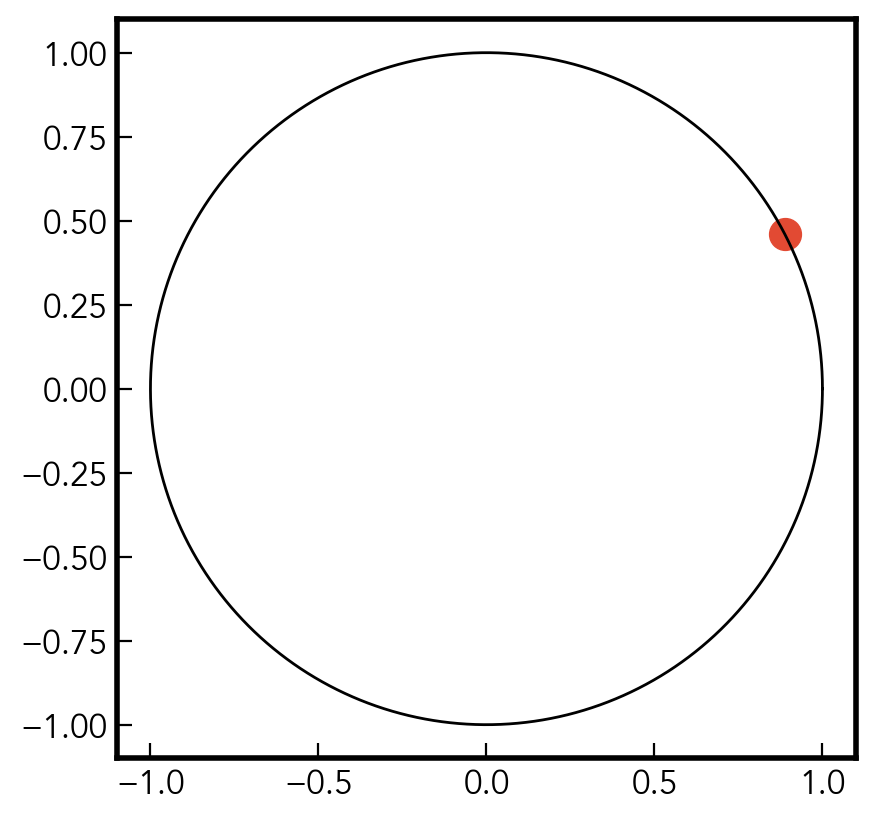

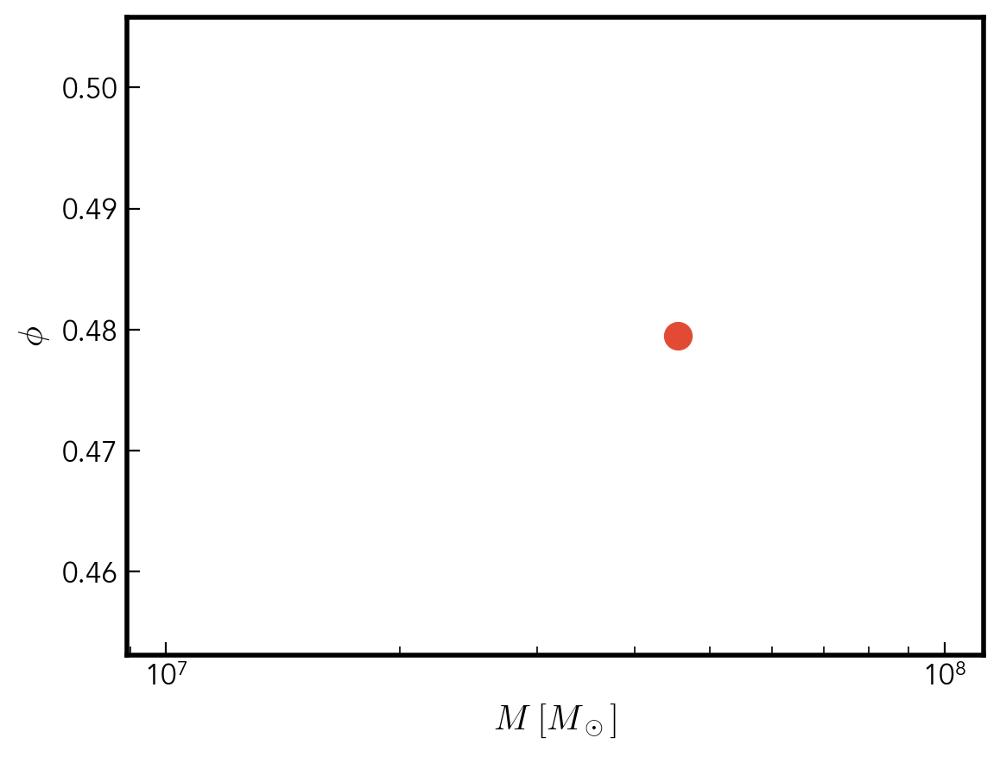

In [20]:
ax=plt.gca()
ax.scatter(sxs/rscale,sys/rscale,s=200*(np.log10(smasses/sminmass)))

pphis=np.linspace(0,2*np.pi,1000)
ax.plot(np.cos(pphis),np.sin(pphis),c='k',lw=1)

ax.set_aspect('equal')
plt.show()

ax=plt.gca()
ax.scatter(smasses,sphases,s=200*(np.log10(smasses/sminmass)))
ax.set_xlabel(r'$M \ [M_\odot]$')
ax.set_ylabel(r'$\phi$')
ax.set_xscale('log')
plt.show()

In [21]:
nsteps=2000000
nplots=200000
epsilon=0.01

ts=np.zeros(nsteps)

Es=np.zeros(nplots)
Ls=np.zeros((3,nplots))
plotRs=np.zeros(nplots)
plotRss=np.zeros(nplots)
plotTs=np.zeros(nplots)

#fig=plt.figure(figsize=(10,10))
#ax=plt.gca()

for i in tqdm(range(nsteps-1)):
#    print('p1x: ',pxs[0],' v1x: ',pvxs[0])
#    print('s1x: ',sxs[0])
    
    #ax.scatter(sxs,sys,s=10,alpha=0.5,c=mpl.cm.magma(np.linspace(0,1,nscat)))
    #ax.scatter(x,y,s=5)
    
    # finding timestep
    rg=np.sqrt(x**2 + y**2 + z**2)
    dt=np.sqrt((rg**2)/(G*M))

    for j in range(nscat):
        dx=x-sxs[j]
        dy=y-sys[j]
        dz=z-szs[j]

        rs=np.sqrt(dx**2 + dy**2 + dz**2)
        dts=np.sqrt((rs**2)/(G*smasses[j]))
        
        if dts<dt:
            dt=dts
            
    dt=epsilon*dt
    
    ts[i+1]=ts[i]+dt
    
    # occasionally records state of the system (relative only to central mass) for plots
    if i%int(nsteps/nplots)==0:
        index=int(i/(nsteps/nplots))
        plotRs[index]=rg
        Es[index]=0.5*(vx**2 + vy**2 + vz**2)-G*M/rg
        Ls[:,index]=np.cross([x,y,z],[vx,vy,vz])
        plotTs[index]=ts[i]
        if nscat==1:
            plotRss[index]=rs
        
    
    # velocity half step
    rg=np.sqrt(x**2 + y**2 + z**2)
    
    asx=0#np.zeros(npart)
    asy=0#np.zeros(npart)
    asz=0#np.zeros(npart)
    
    for j in range(nscat):
        dx=x-sxs[j]
        dy=y-sys[j]
        dz=z-szs[j]

        rs=np.sqrt(dx**2 + dy**2 + dz**2)
        
        asx=asx-G*smasses[j]*dx/(rs**3)
        asy=asy-G*smasses[j]*dy/(rs**3)   
        asz=asz-G*smasses[j]*dz/(rs**3)   
        
    
    vx=vx-0.5*dt*G*M*x/(rg**3) + 0.5*dt*asx
    vy=vy-0.5*dt*G*M*y/(rg**3) + 0.5*dt*asy
    vz=vz-0.5*dt*G*M*z/(rg**3) + 0.5*dt*asz
    
    sphases=(sphases+np.pi*dt/period)%(2*np.pi)

    svxs=-vscat*np.sin(sphases)
    svys=vscat*np.cos(sphases)
    svzs=np.zeros(nscat)
    
    # position full step
    x=x+dt*vx
    y=y+dt*vy
    z=z+dt*vz
    
    sphases=(sphases+np.pi*dt/period)%(2*np.pi) # we've already half stepped this, so now at i+1
    
    sxs=rscat*np.cos(sphases)
    sys=rscat*np.sin(sphases)
    szs=np.zeros(nscat)
    
    # velocity half step
    rg=np.sqrt(x**2 + y**2 + z**2)
    
    asx=0#np.zeros(npart)
    asy=0#np.zeros(npart)
    asz=0#np.zeros(npart)
    
    for j in range(nscat):
        dx=x-sxs[j]
        dy=y-sys[j]
        dz=z-szs[j]

        rs=np.sqrt(dx**2 + dy**2 + dz**2)
        
        asx=asx-G*smasses[j]*dx/(rs**3)
        asy=asy-G*smasses[j]*dy/(rs**3)   
        asz=asz-G*smasses[j]*dz/(rs**3)   
        
    
    vx=vx-0.5*dt*G*M*x/(rg**3) + 0.5*dt*asx
    vy=vy-0.5*dt*G*M*y/(rg**3) + 0.5*dt*asy
    vz=vz-0.5*dt*G*M*z/(rg**3) + 0.5*dt*asz
    
    svxs=-vscat*np.sin(sphases)
    svys=vscat*np.cos(sphases)
    svzs=np.zeros(nscat)
    
#ax.set_aspect('equal')
#ax.set_xlim(-2*rscat,2*rscat)
#ax.set_ylim(-2*rscat,2*rscat)
#plt.show()

100%|█████████████████████████████████████████████████████████████████████████████████████████| 1999999/1999999 [04:15<00:00, 7831.07it/s]


/Users/zephyr/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in sqrt
  
/Users/zephyr/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """
/Users/zephyr/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in true_divide
  import sys


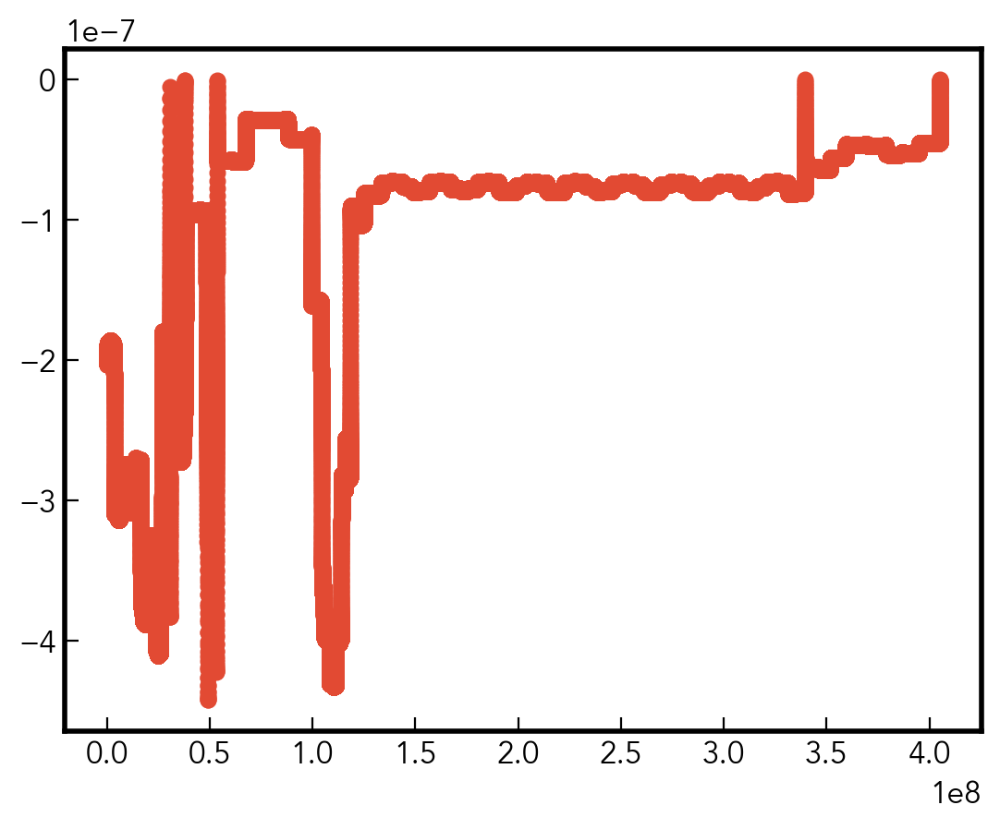

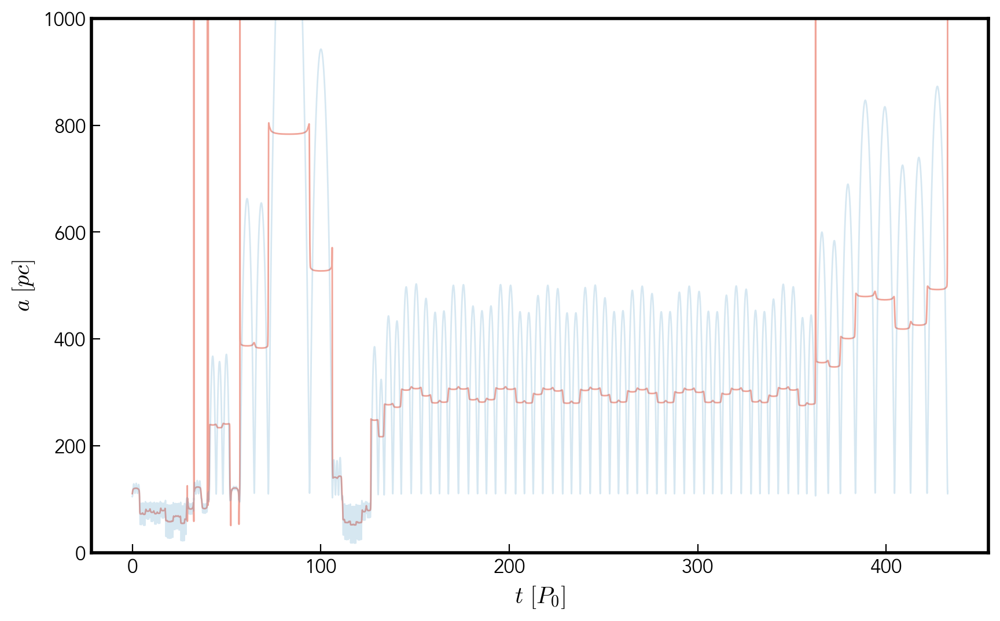

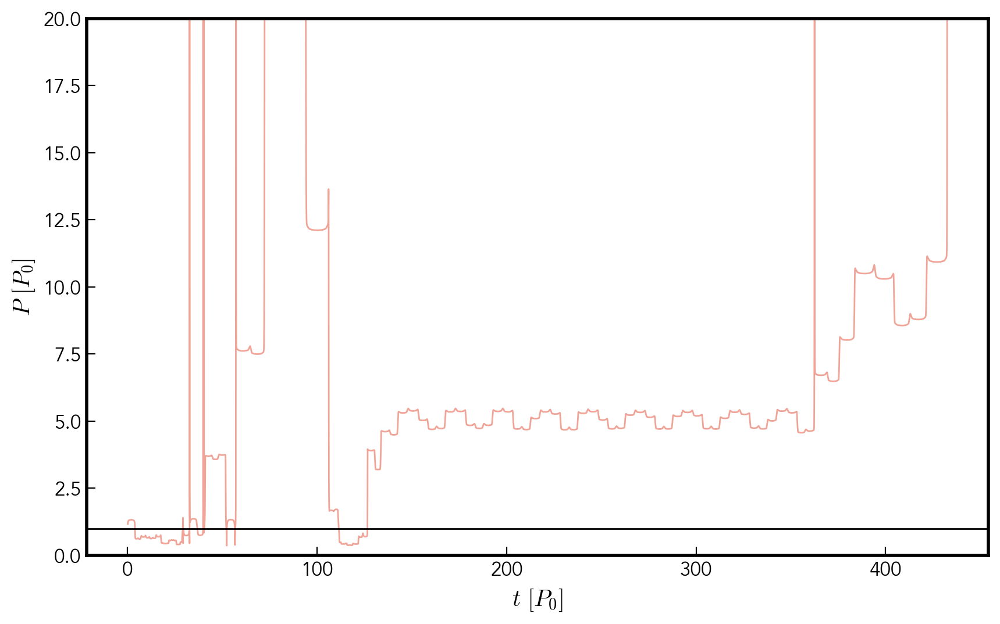

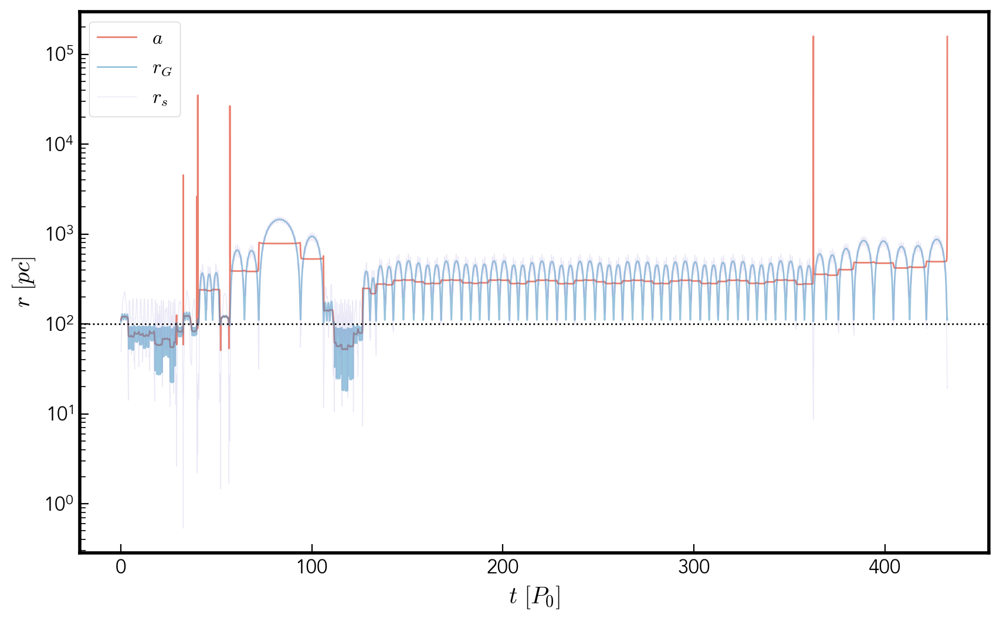

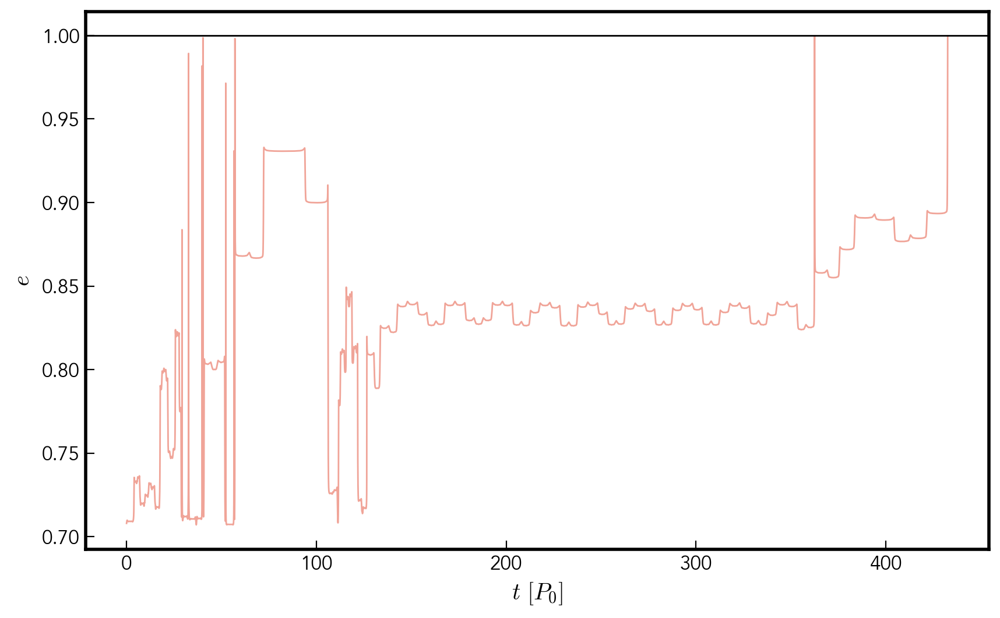

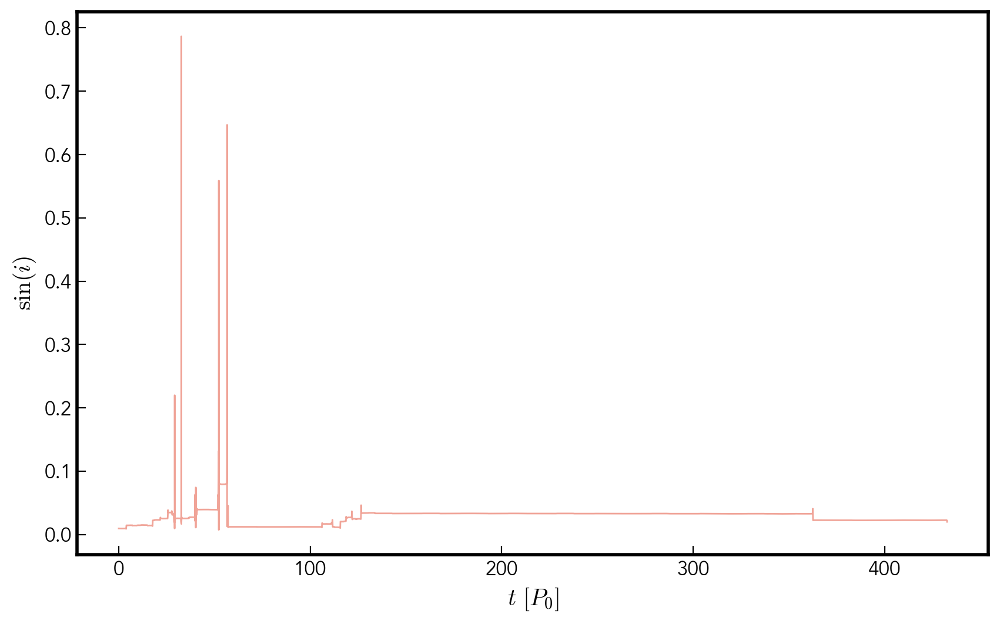

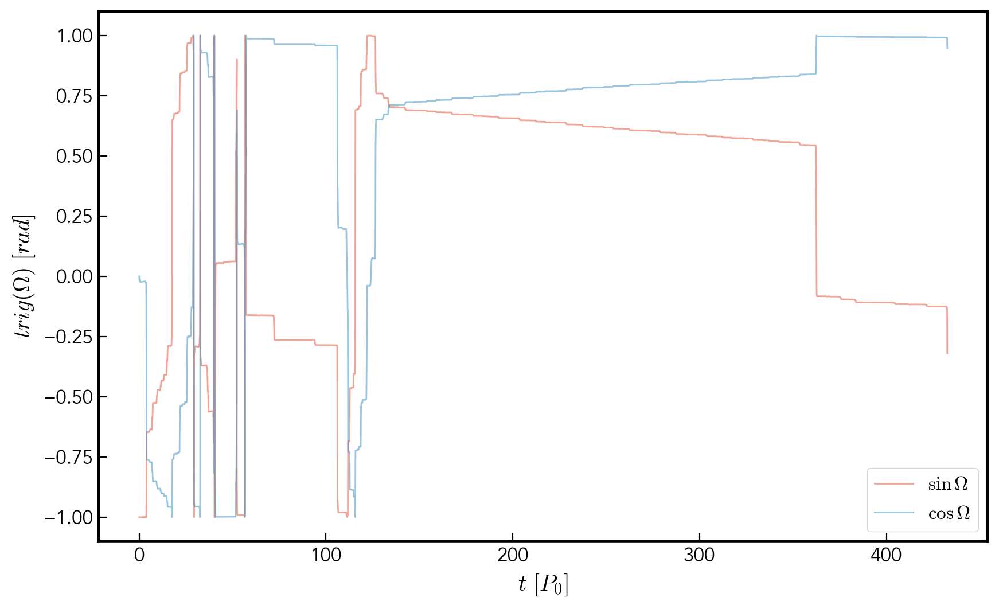

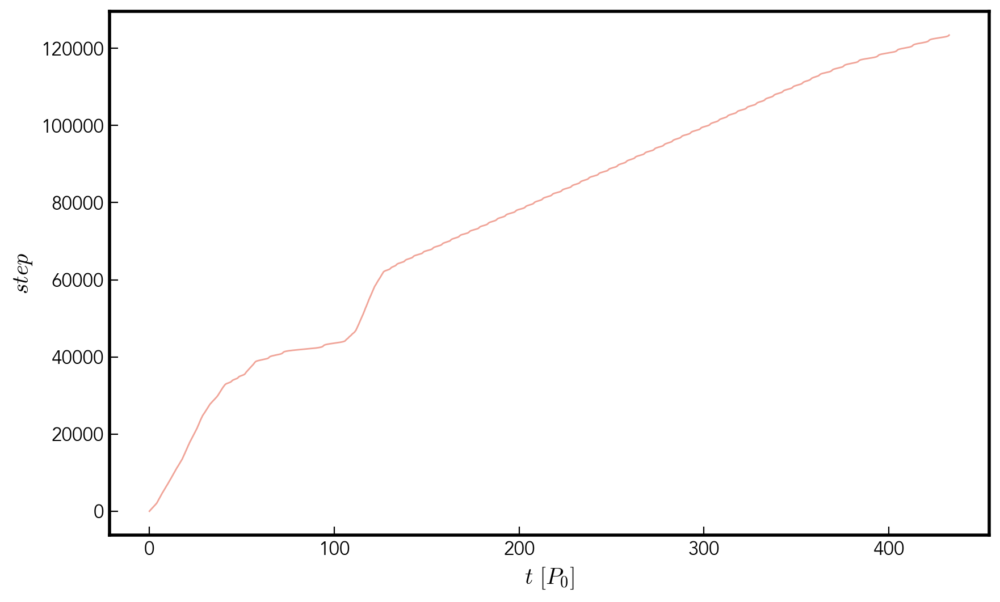

In [22]:
semis=-G*M/(2*Es)
periods=2*np.pi*np.sqrt((semis**3)/(G*M))
Lmags=np.linalg.norm(Ls,axis=0)
es=np.sqrt(1+Es*(Lmags**2)/((G*M)**2))
zhats=Ls/Lmags
sinis=np.sqrt(zhats[0,:]**2 + zhats[1,:]**2)
omegas=np.arctan2(zhats[0,:]/sinis,-zhats[1,:]/sinis)

bound=np.flatnonzero(~np.isnan(periods))

ax=plt.gca()
ax.scatter(plotTs[bound],Es[bound])
plt.show()

fig=plt.figure(figsize=(10,6))
ax=plt.gca()
ax.plot(plotTs[bound]/period,semis[bound],lw=1,alpha=0.5)
ax.plot(plotTs[bound]/period,plotRs[bound],lw=1,alpha=0.2)
ax.set_ylabel(r'$a \ [pc]$')
ax.set_xlabel(r'$t \ [P_0]$')
ax.set_ylim(0,min(max(semis[bound]),1000))
plt.show()

fig=plt.figure(figsize=(10,6))
ax=plt.gca()
ax.plot(plotTs[bound]/period,periods[bound]/period,lw=1,alpha=0.5)
ax.axhline(1,c='k',lw=1)
ax.set_ylabel(r'$P \ [P_0]$')
ax.set_xlabel(r'$t \ [P_0]$')
ax.set_ylim(0,min(max(periods[bound]),20))
plt.show()

fig=plt.figure(figsize=(10,6))
ax=plt.gca()
ax.plot(plotTs[bound]/period,np.abs(semis[bound]),lw=1,alpha=0.7,label=r'$a$')
ax.plot(plotTs[bound]/period,np.abs(plotRs[bound]),lw=1,alpha=0.5,label=r'$r_G$')
ax.plot(plotTs[bound]/period,np.abs(plotRss[bound]),lw=0.5,alpha=0.2,label=r'$r_s$')
ax.axhline(100,c='k',lw=1,ls=':')
ax.set_ylabel(r'$r \ [pc]$')
ax.set_xlabel(r'$t \ [P_0]$')
ax.set_yscale('log')
plt.legend()
plt.show()

fig=plt.figure(figsize=(10,6))
ax=plt.gca()
ax.plot(plotTs[bound]/period,es[bound],lw=1,alpha=0.5)
ax.axhline(1,c='k',lw=1)
ax.set_ylabel(r'$e$')
ax.set_xlabel(r'$t \ [P_0]$')
plt.show()

fig=plt.figure(figsize=(10,6))
ax=plt.gca()
ax.plot(plotTs[bound]/period,sinis[bound],lw=1,alpha=0.5)
ax.set_ylabel(r'$\sin(i)$')
ax.set_xlabel(r'$t \ [P_0]$')
plt.show()

fig=plt.figure(figsize=(10,6))
ax=plt.gca()
ax.plot(plotTs[bound]/period,np.sin(omegas[bound]),lw=1,alpha=0.5,label=r'$\sin \Omega$')
ax.plot(plotTs[bound]/period,np.cos(omegas[bound]),lw=1,alpha=0.5,label=r'$\cos \Omega$')
ax.set_ylabel(r'$trig(\Omega) \ [rad]$')
ax.set_xlabel(r'$t \ [P_0]$')
plt.legend()
plt.show()

fig=plt.figure(figsize=(10,6))
ax=plt.gca()
ax.plot(plotTs[bound]/period,np.arange(bound.size),lw=1,alpha=0.5)
ax.set_ylabel(r'$step$')
ax.set_xlabel(r'$t \ [P_0]$')
plt.show()

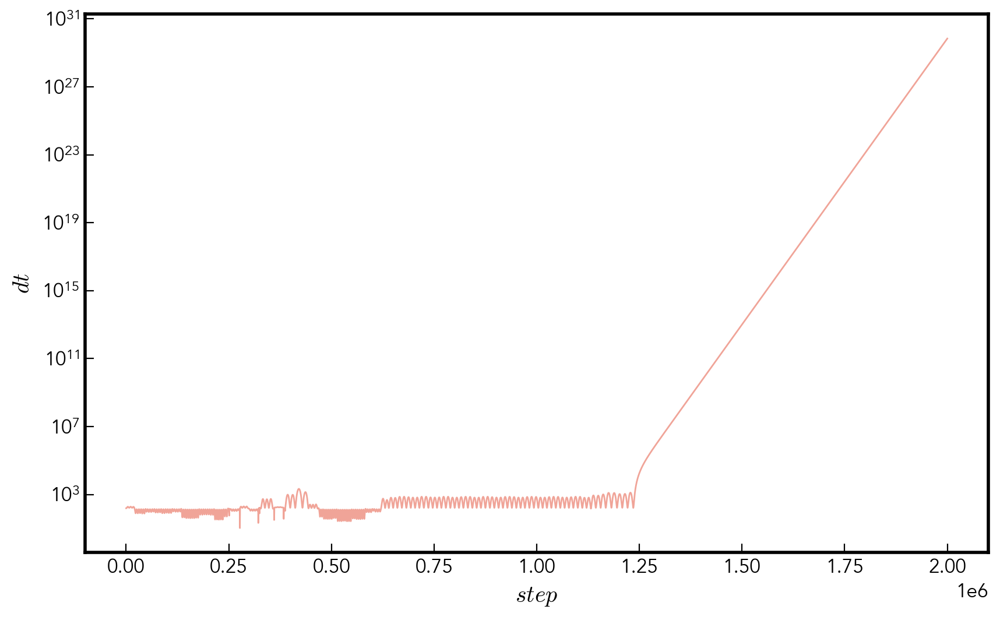

In [23]:
fig=plt.figure(figsize=(10,6))
ax=plt.gca()
ax.plot(np.arange(nsteps-1),ts[1:]-ts[:-1],lw=1,alpha=0.5)
ax.set_xlabel(r'$step$')
ax.set_ylabel(r'$dt$')
ax.set_yscale('log')
plt.show()

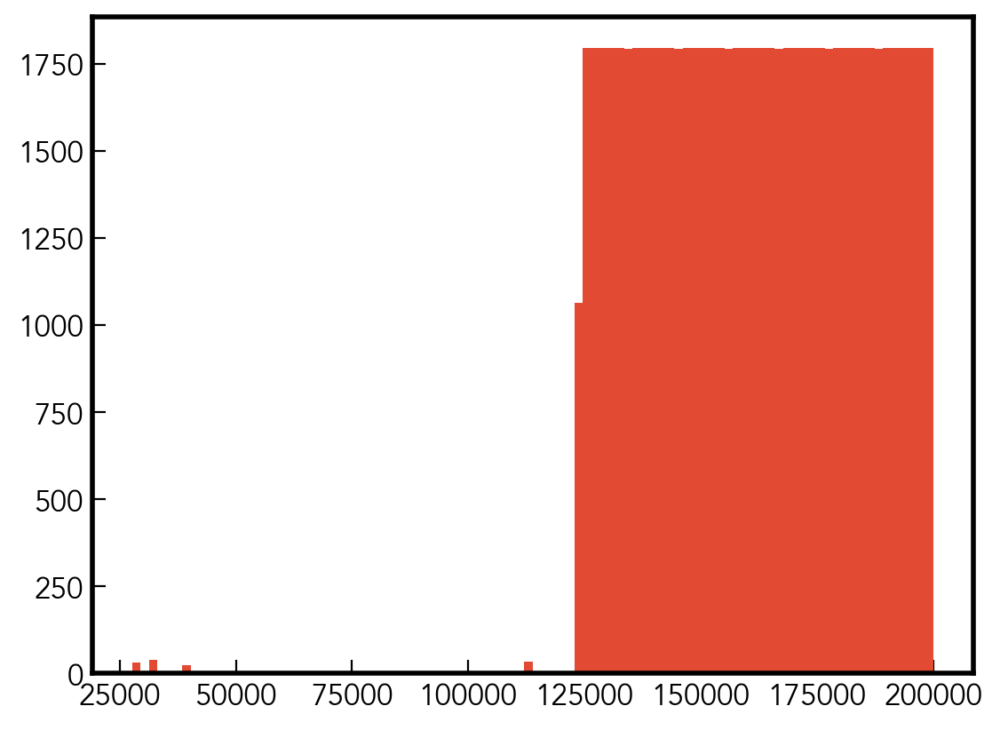

In [24]:
ax=plt.gca()
ax.hist(np.flatnonzero(np.isnan(periods)),bins='auto')
plt.show()

# playing with animations

In [11]:
%matplotlib notebook

In [15]:
import matplotlib.pyplot as plt
import matplotlib.animation
import numpy as np
from IPython.display import HTML

bound=np.flatnonzero(~np.isnan(periods))

plt.close()

fig=plt.figure(figsize=(2,1))
ax=plt.gca()
ax.plot(plotTs[bound]/period,np.abs(semis[bound]),lw=1,alpha=0.5)
ax.plot(plotTs[bound]/period,np.abs(plotRs[bound]),lw=1,alpha=0.2)
ax.axhline(100,c='k',lw=1,ls=':')
ax.set_ylabel(r'$a \ [pc]$')
ax.set_xlabel(r'$t \ [P_0]$')
ax.set_yscale('log')
l, = ax.plot(plotTs[0]/period,np.abs(plotRs[0]),'o')

def animate(i):
    l.set_data(plotTs[i]/period,np.abs(plotRs[i]))

ani = matplotlib.animation.FuncAnimation(fig, animate, frames=1000, interval=1000/60, repeat=True)
HTML(ani.to_jshtml())

<IPython.core.display.Javascript object>

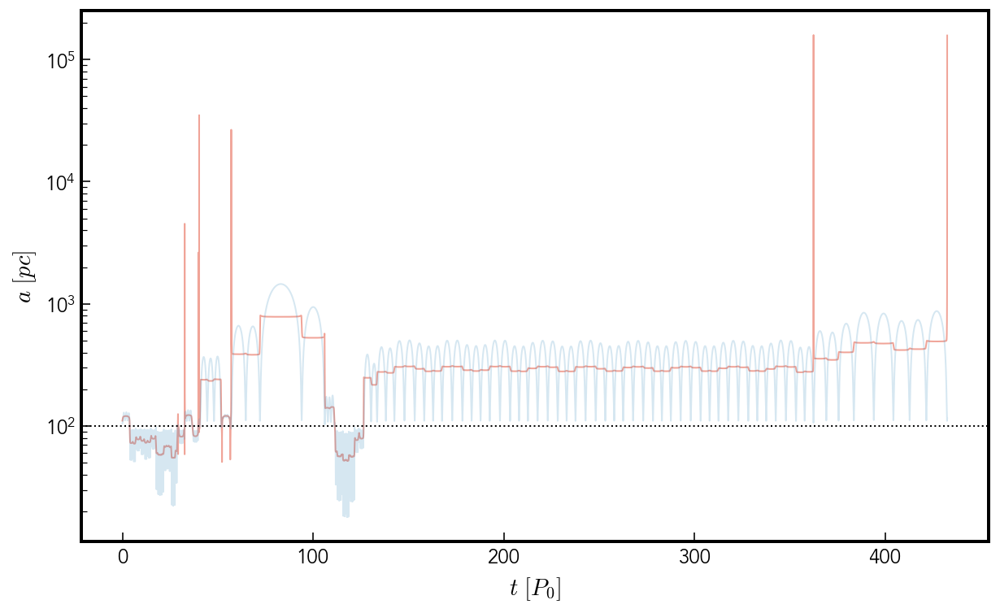

In [336]:
fig=plt.figure(figsize=(10,6))
ax=plt.gca()
ax.plot(plotTs[bound]/period,np.abs(semis[bound]),lw=1,alpha=0.5)
ax.plot(plotTs[bound]/period,np.abs(plotRs[bound]),lw=1,alpha=0.2)
ax.axhline(100,c='k',lw=1,ls=':')
ax.set_ylabel(r'$a \ [pc]$')
ax.set_xlabel(r'$t \ [P_0]$')
ax.set_yscale('log')
plt.show()

# following multiple particles

In [93]:
G=astropy.constants.G.to(u.pc**3 * u.Msun**-1 * u.yr**-2).value
M=1e10

npart=4
nscat=6

rscale=100
vscale=1e-4 # 0.1 pc/yr = 100 km/s

rscat=100
vscat=np.sqrt(G*M/(rscat))
smaxmass=1e7
sminmass=smaxmass/nscat
period=2*np.pi*np.sqrt((rscat**3)/(G*M))

pxs=rscale*(-1+2*np.random.rand(npart))
pys=rscale*(-1+2*np.random.rand(npart))
pzs=rscale*(-1+2*np.random.rand(npart))

pvxs=vscat*(-1+2*np.random.rand(npart))
pvys=vscat*(-1+2*np.random.rand(npart))
pvzs=vscat*(-1+2*np.random.rand(npart))

sphases=2*np.pi*np.random.rand(nscat)
smasses=sminmass/(1-np.random.rand(nscat))

sxs=rscat*np.cos(sphases)
sys=rscat*np.sin(sphases)
szs=np.zeros(nscat)

svxs=-vscat*np.sin(sphases)
svys=vscat*np.cos(sphases)
svzs=np.zeros(nscat)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 999/999 [00:12<00:00, 76.98it/s]


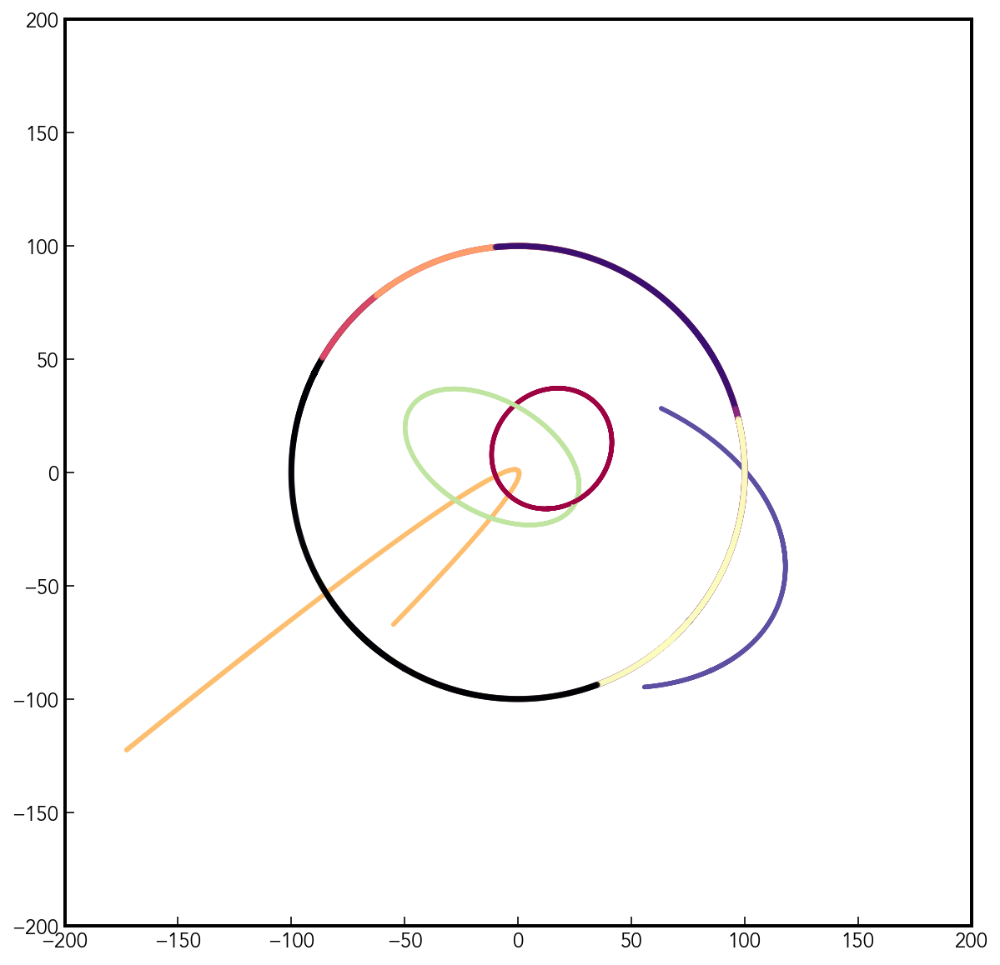

In [94]:
nsteps=1000
epsilon=0.1

ts=np.zeros(nsteps)

fig=plt.figure(figsize=(10,10))
ax=plt.gca()

for i in tqdm(range(nsteps-1)):
#    print('p1x: ',pxs[0],' v1x: ',pvxs[0])
#    print('s1x: ',sxs[0])
    
    ax.scatter(sxs,sys,s=10,alpha=0.5,c=mpl.cm.magma(np.linspace(0,1,nscat)))
    ax.scatter(pxs,pys,s=5,c=mpl.cm.Spectral(np.linspace(0,1,npart)))
    
    # finding timestep
    rgs=np.sqrt(pxs**2 + pys**2 + pzs**2)
    dt=np.min(np.sqrt((rgs**2)/(G*M)))

    for j in range(nscat):
        dxs=pxs-sxs[j]
        dys=pys-sys[j]
        dzs=pzs-szs[j]

        rss=np.sqrt(dxs**2 + dys**2 + dzs**2)
        dts=np.min(np.sqrt((rss**2)/(G*smasses[j])))
        
        if np.min(dts)<dt:
            dt=np.min(dts)
            
    dt=epsilon*dt
    
    ts[i+1]=ts[i]+dt
    
    # velocity half step
    rgs=np.sqrt(pxs**2 + pys**2 + pzs**2)
    
    asxs=np.zeros(npart)
    asys=np.zeros(npart)
    aszs=np.zeros(npart)
    
    for j in range(nscat):
        dxs=pxs-sxs[j]
        dys=pys-sys[j]
        dzs=pzs-szs[j]

        rss=np.sqrt(dxs**2 + dys**2 + dzs**2)
        
        asxs=asxs-G*smasses[j]*dxs/(rss**3)
        asys=asys-G*smasses[j]*dys/(rss**3)   
        aszs=aszs-G*smasses[j]*dzs/(rss**3)   
        
    
    pvxs=pvxs-0.5*dt*G*M*pxs/(rgs**3) + 0.5*dt*asxs
    pvys=pvys-0.5*dt*G*M*pys/(rgs**3) + 0.5*dt*asys
    pvzs=pvzs-0.5*dt*G*M*pzs/(rgs**3) + 0.5*dt*aszs
    
    sphases=(sphases+np.pi*dt/period)%(2*np.pi)

    svxs=-vscat*np.sin(sphases)
    svys=vscat*np.cos(sphases)
    svzs=np.zeros(nscat)
    
    # position full step
    pxs=pxs+dt*pvxs
    pys=pys+dt*pvys
    pzs=pzs+dt*pvzs
    
    sphases=(sphases+np.pi*dt/period)%(2*np.pi) # we've already half stepped this, so now at i+1
    
    sxs=rscat*np.cos(sphases)
    sys=rscat*np.sin(sphases)
    szs=np.zeros(nscat)
    
    # velocity half step
    rgs=np.sqrt(pxs**2 + pys**2 + pzs**2)
    
    asxs=np.zeros(npart)
    asys=np.zeros(npart)
    aszs=np.zeros(npart)
    
    for j in range(nscat):
        dxs=pxs-sxs[j]
        dys=pys-sys[j]
        dzs=pzs-szs[j]

        rss=np.sqrt(dxs**2 + dys**2 + dzs**2)
        
        asxs=asxs-G*smasses[j]*dxs/(rss**3)
        asys=asys-G*smasses[j]*dys/(rss**3)   
        aszs=aszs-G*smasses[j]*dzs/(rss**3)     
        
    
    pvxs=pvxs-0.5*dt*G*M*pxs/(rgs**3) + 0.5*dt*asxs
    pvys=pvys-0.5*dt*G*M*pys/(rgs**3) + 0.5*dt*asys
    pvzs=pvzs-0.5*dt*G*M*pzs/(rgs**3) + 0.5*dt*aszs

    svxs=-vscat*np.sin(sphases)
    svys=vscat*np.cos(sphases)
    svzs=np.zeros(nscat)

ax.set_aspect('equal')
ax.set_xlim(-2*rscat,2*rscat)
ax.set_ylim(-2*rscat,2*rscat)
plt.show()

In [28]:
print(ts/period)

[0.00000000e+00 3.52571385e-12 7.05142667e-12 1.05771385e-11
 1.41028492e-11 1.76285589e-11 2.11542676e-11 2.46799753e-11
 2.82056819e-11 3.17313875e-11 3.52570920e-11 3.87827955e-11
 4.23084980e-11 4.58341994e-11 4.93598998e-11 5.28855992e-11
 5.64112976e-11 5.99369949e-11 6.34626911e-11 6.69883864e-11
 7.05140806e-11 7.40397738e-11 7.75654659e-11 8.10911570e-11
 8.46168471e-11 8.81425361e-11 9.16682241e-11 9.51939111e-11
 9.87195970e-11 1.02245282e-10 1.05770966e-10 1.09296649e-10
 1.12822330e-10 1.16348011e-10 1.19873691e-10 1.23399370e-10
 1.26925047e-10 1.30450724e-10 1.33976399e-10 1.37502074e-10
 1.41027747e-10 1.44553420e-10 1.48079091e-10 1.51604762e-10
 1.55130431e-10 1.58656100e-10 1.62181767e-10 1.65707433e-10
 1.69233098e-10 1.72758763e-10 1.76284426e-10 1.79810088e-10
 1.83335749e-10 1.86861409e-10 1.90387068e-10 1.93912726e-10
 1.97438383e-10 2.00964039e-10 2.04489694e-10 2.08015348e-10
 2.11541001e-10 2.15066652e-10 2.18592303e-10 2.22117953e-10
 2.25643602e-10 2.291692

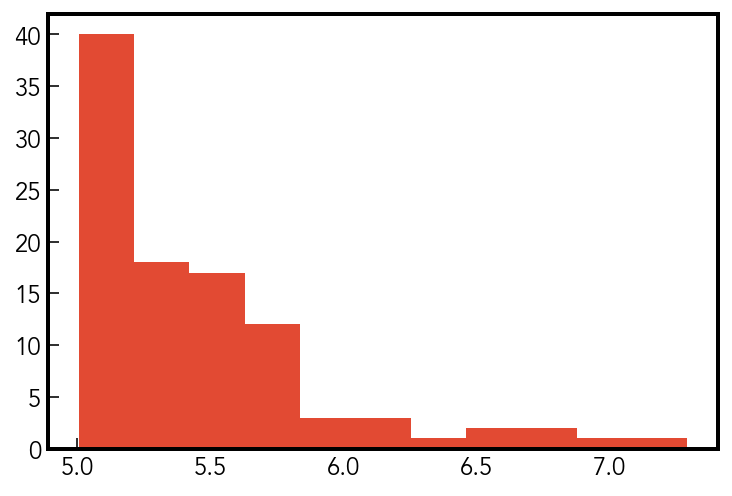

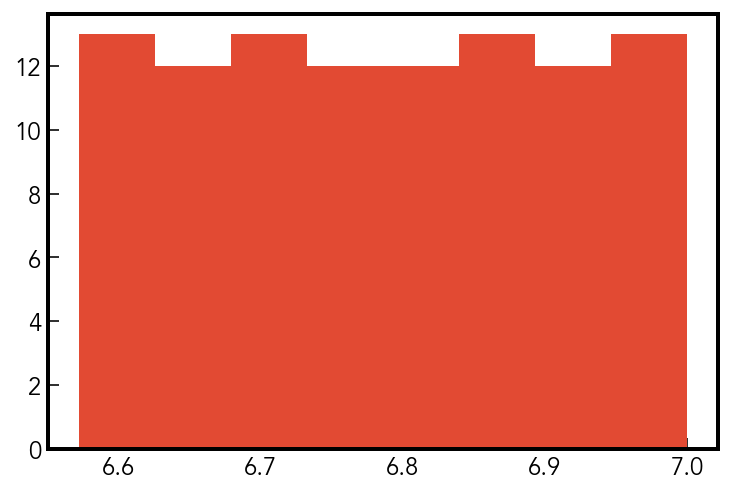

In [106]:
nscat=100

sminmass=1e7/nscat

smasses=sminmass/(1-np.random.rand(nscat))

plt.hist(np.log10(smasses),bins='auto')
plt.show()

altms=np.zeros(nscat)
altms[0]=1e7
for i in range(nscat-1):
    altms[i+1]=altms[i]/(1+1/nscat)
    
plt.hist(np.log10(altms),bins='auto')
plt.show()